# Feature Categories

**Relative scaler spacial features.**
<br>
Using relative magnitudinal components which represent spacial locations within a domain, given the fixed boundary of that domain.

**Absolute value spacial features.**
<br>
Using absolute positions to represent spacial locations within a domain, sampled from the boundary of that domain.

**Vector features.**
<br>
Using direction and magnitude values to represent a control input.

**Auxilliary features.**
<br>
Using values which map to the one (or both) of the spacial & vector features.


# Initial Feature Exploration

- NB10422645/data/Geoffrey2D_Case1/dataSet_gridSampled_10.parquet

In [5]:
%cd "~/lab/NB10422645 (Stage - Airbus)"

#importing libraries
from sklearn import preprocessing
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
sns.set(style="ticks")
%matplotlib inline

/home/ggarrett/lab/NB10422645 (Stage - Airbus)


In [6]:
df1 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet2_gridSampled_7.parquet")
df1_sample = df1.sample(10000)

By plotting a heatmap showing the correlation between all values within the dataset, a sense of the correlation between parameters can be given, for their preprocessed form.

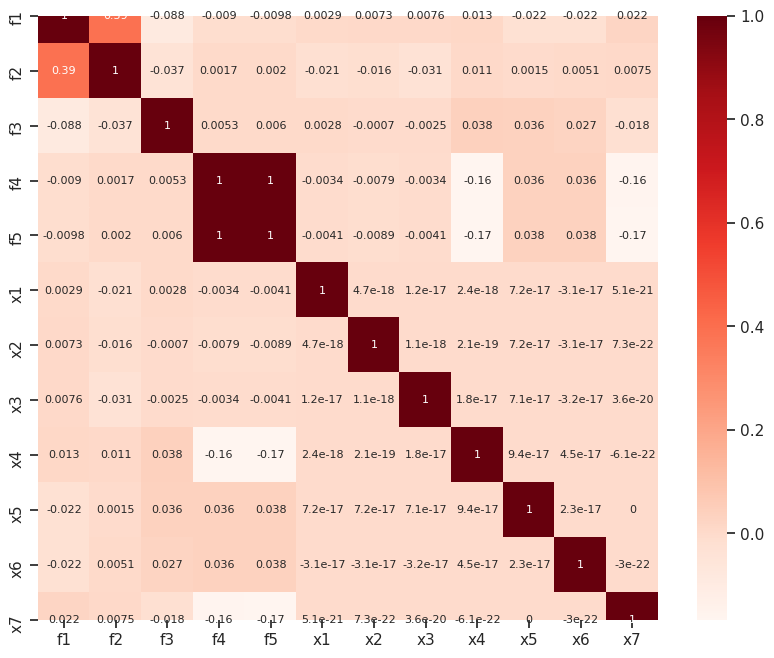

In [7]:
#Using Pearson Correlationnp.linalg.norm(x[-4:])
plt.figure(figsize=(10,8), dpi=100)
cor = df1.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

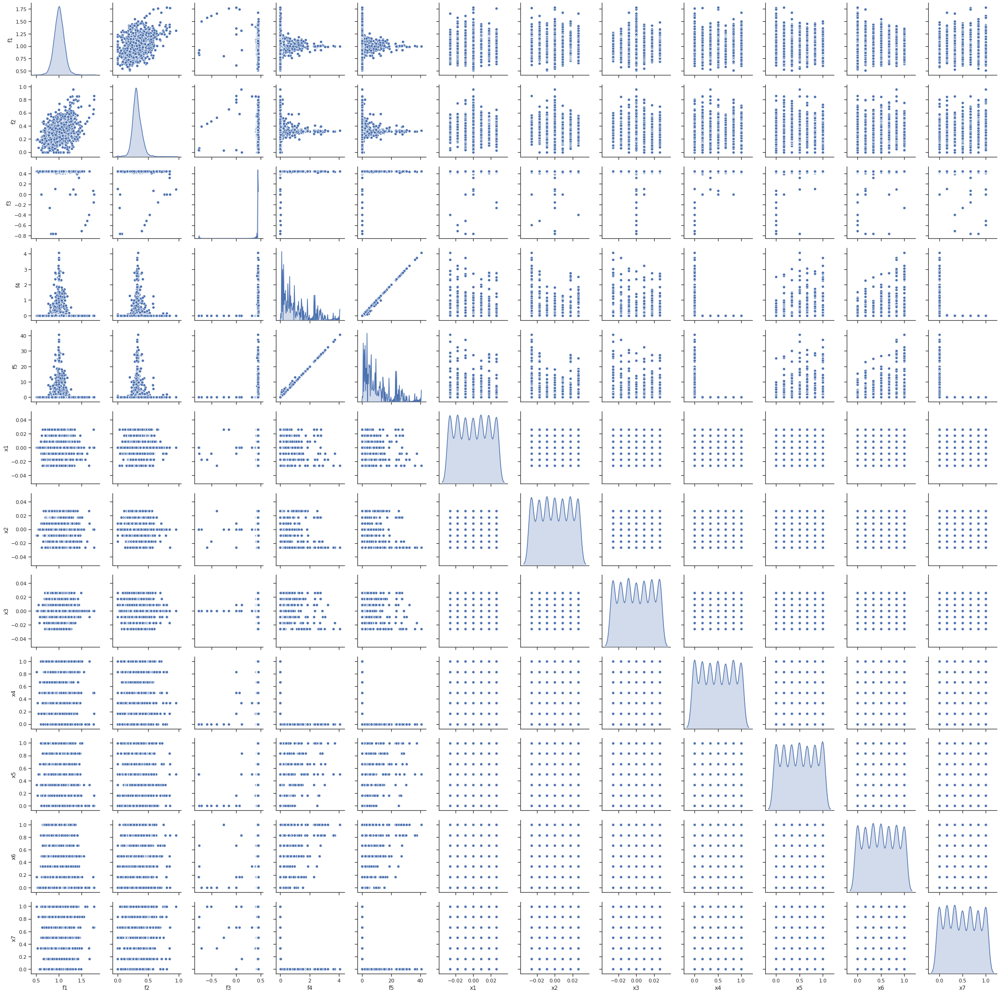

In [8]:
pp1 = sns.pairplot(df1_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet2_gridSampled_7_unprocessed_pairplot.png")

**Note 1**:
$x_4$, $x_5$, $x_6$ and $x_7$ can be representd by a point on a 4D sphere, as their relative size to eachother form a unique input. That is to say that $\overline{X}_{i,(4..7)} = \overline{X}_{j,(4..7)} = \{1.0, 1.0, 1.0, 1.0\} = \{0.1, 0.1, 0.1, 0.1\}$. Therefore these inputs shoud be normalized to a unit magnitude in order to reduce ambiguity in the input design vector.

**Note 2**: The relative difference between $\overline{X}_{1..3}$ and $\overline{X}_{4..7}$ can influence some machine learning algorithms to place more importance on $\overline{X}_{4..7}$ and therefore $\overline{X}_{1..3}$ should be scaled to [-1,1].

In [9]:
df2 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet2_gridSampled_7.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_f_a = preprocessing.MinMaxScaler()

df2.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df2.loc[:,"x4":"x7"].values)
df2.loc[:,"x1":"x3"] = t1_x_o.fit_transform(df2.loc[:,"x1":"x3"].values)
df2.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df2.loc[:,"f1":"f4"].values)

df2_sample = df2.sample(100000)

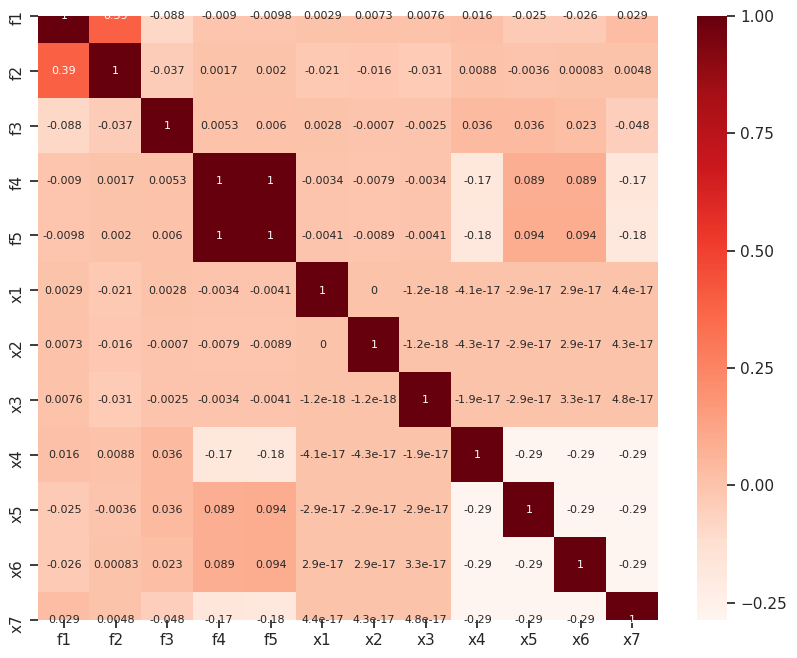

In [10]:
plt.figure(figsize=(10,8), dpi=100)
cor = df2.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

In [ ]:
sns.pairplot(df2_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet2_gridSampled_7_processed_pairplot.png")

In [3]:
df3 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet2_gridSampled_7.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_x_o_nm = preprocessing.Normalizer()
t1_f_a = preprocessing.MinMaxScaler()

df3.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df3.loc[:,"x4":"x7"].values)
df3.loc[:,"x1":"x3"] = t1_x_o_mm.fit_transform(df3.loc[:,"x1":"x3"].values)
df3.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df3.loc[:,"f1":"f4"].values)

temp = df3.loc[:,"x1":"x3"].apply(np.square)
temp = np.sum(temp.values, axis=1)
df3["x8"] = np.sqrt(temp)

df3.loc[:,"x1":"x3"] = t1_x_o_nm.fit_transform(df3.loc[:,"x1":"x3"].values)

df3_sample = df3.sample(100000)

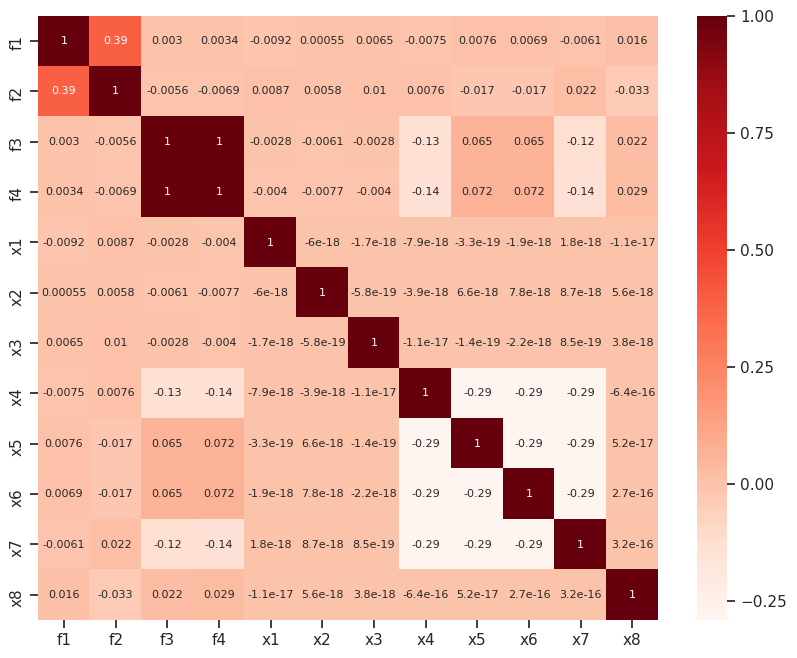

In [4]:
plt.figure(figsize=(10,8), dpi=100)
cor = df3.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

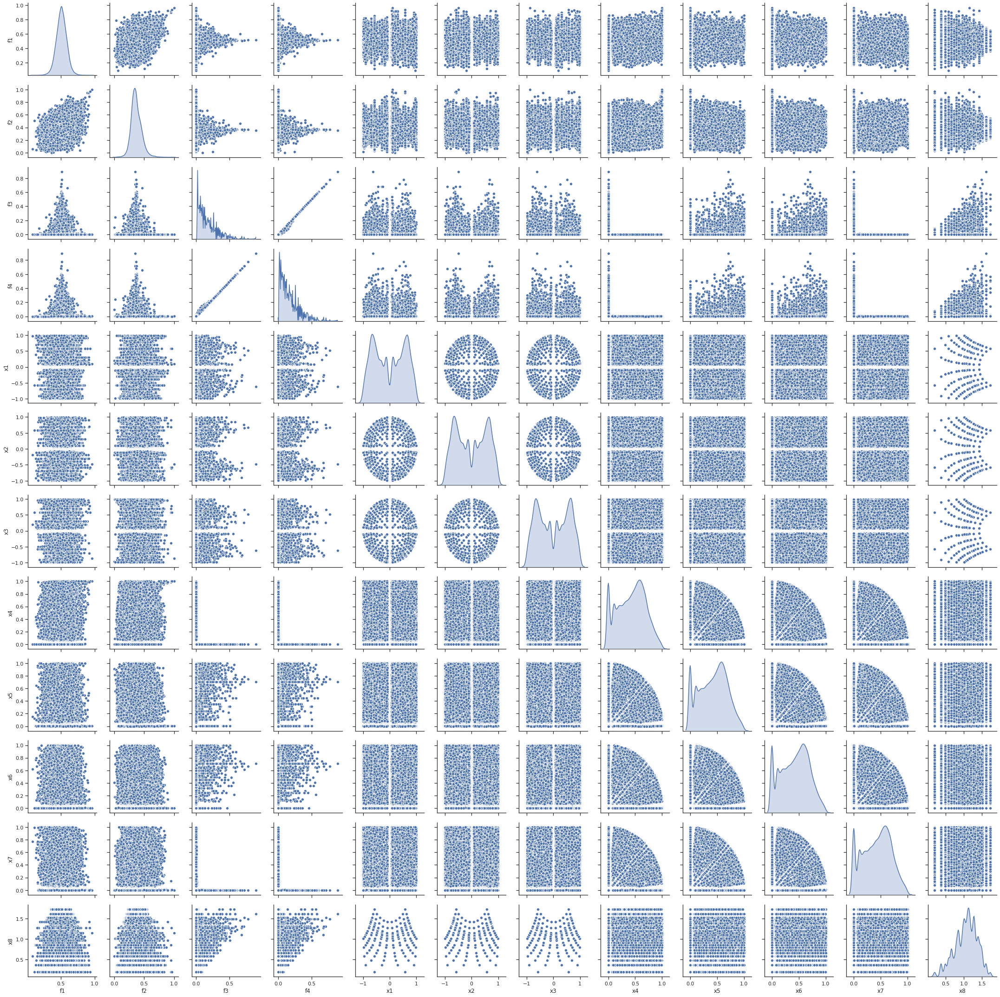

In [5]:
sns.pairplot(df3_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet_gridSampled_10_processed2_pairplot.png")

In [21]:
df3_1 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet2_sol1_gridSampled_8.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_x_o_nm = preprocessing.Normalizer()
t1_f_a = preprocessing.MinMaxScaler()

df3_1.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df3_1.loc[:,"x4":"x7"].values)
df3_1.loc[:,"x1":"x3"] = t1_x_o_mm.fit_transform(df3_1.loc[:,"x1":"x3"].values)
df3_1.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df3_1.loc[:,"f1":"f4"].values)

temp = df3_1.loc[:,"x1":"x3"].apply(np.square)
temp = np.sum(temp.values, axis=1)
df3_1["x8"] = np.sqrt(temp)

df3_1.loc[:,"x1":"x3"] = t1_x_o_nm.fit_transform(df3_1.loc[:,"x1":"x3"].values)

df3_1_sample = df3_1.sample(10000)

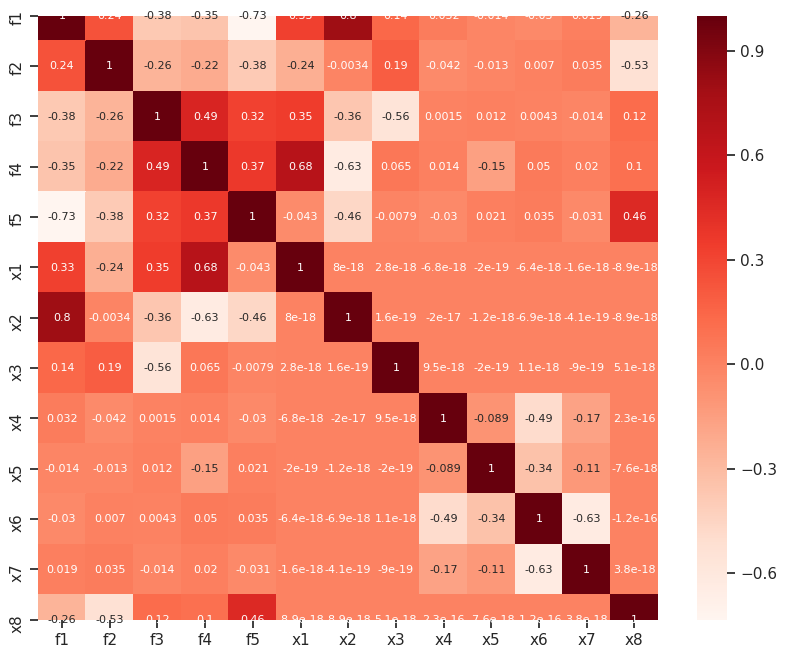

In [22]:
plt.figure(figsize=(10,8), dpi=100)
cor = df3_1.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

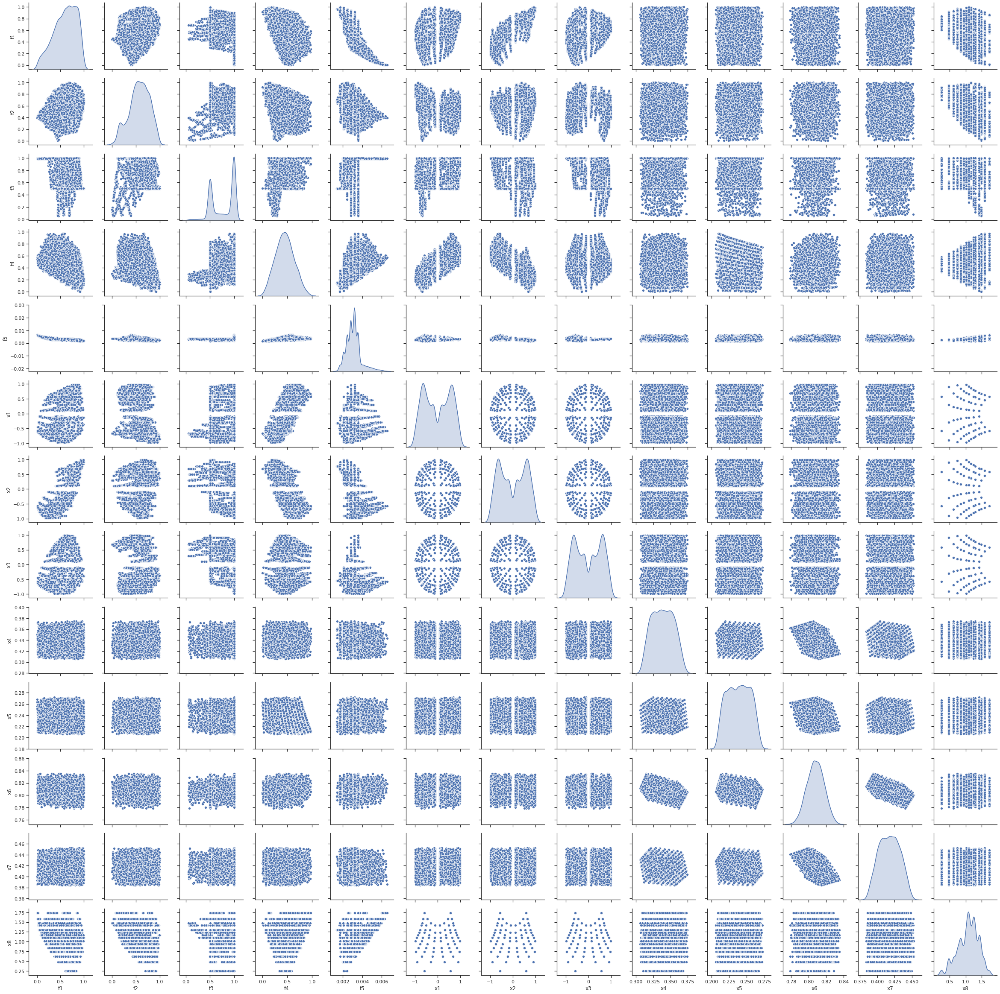

In [23]:
sns.pairplot(df3_1_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet2_sol1_gridSampled_8_processed2_pairplot.png")

# Dataset Filtering

In [13]:
df4 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet2_gridSampled_7.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_x_o_nm = preprocessing.Normalizer()
t1_f_a = preprocessing.MinMaxScaler()

# x4:x7 pre.
df4.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df4.loc[:,"x4":"x7"].values)

# Filtering
df4.drop(index=df4[df4["x4"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x5"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x6"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x7"]<=0.05].index, inplace=True)

# x1:x3 pre.
df4.loc[:,"x1":"x3"] = t1_x_o_mm.fit_transform(df4.loc[:,"x1":"x3"].values)

# Adding feature from x1:x3.
temp = df4.loc[:,"x1":"x3"].apply(np.square)
temp = np.sum(temp.values, axis=1)
df4["x8"] = np.sqrt(temp)

# x1:x3 post.
df4.loc[:,"x1":"x3"] = t1_x_o_nm.fit_transform(df4.loc[:,"x1":"x3"].values)

# f1:f4 pre.
df4.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df4.loc[:,"f1":"f4"].values)

df4_sample = df4.sample(100000)


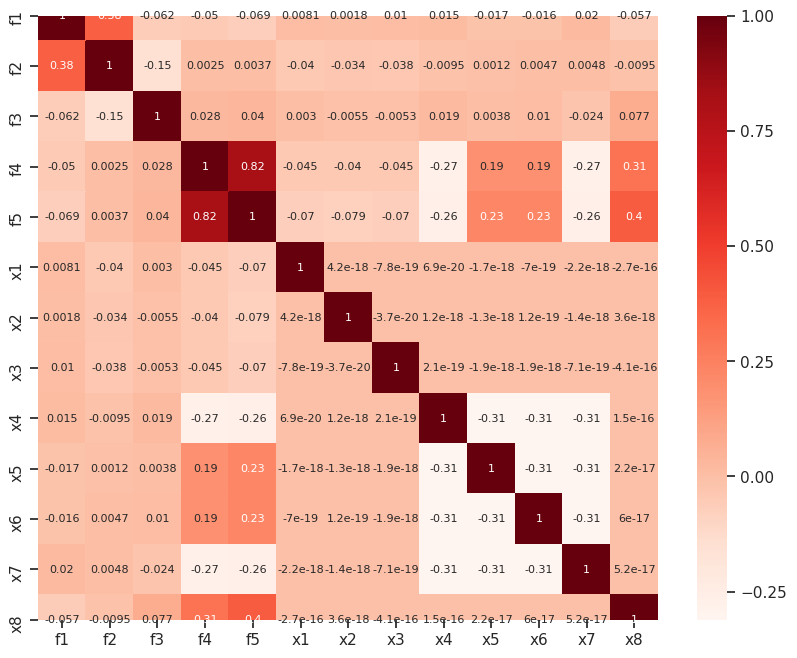

In [14]:
plt.figure(figsize=(10,8), dpi=100)
cor = df4.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

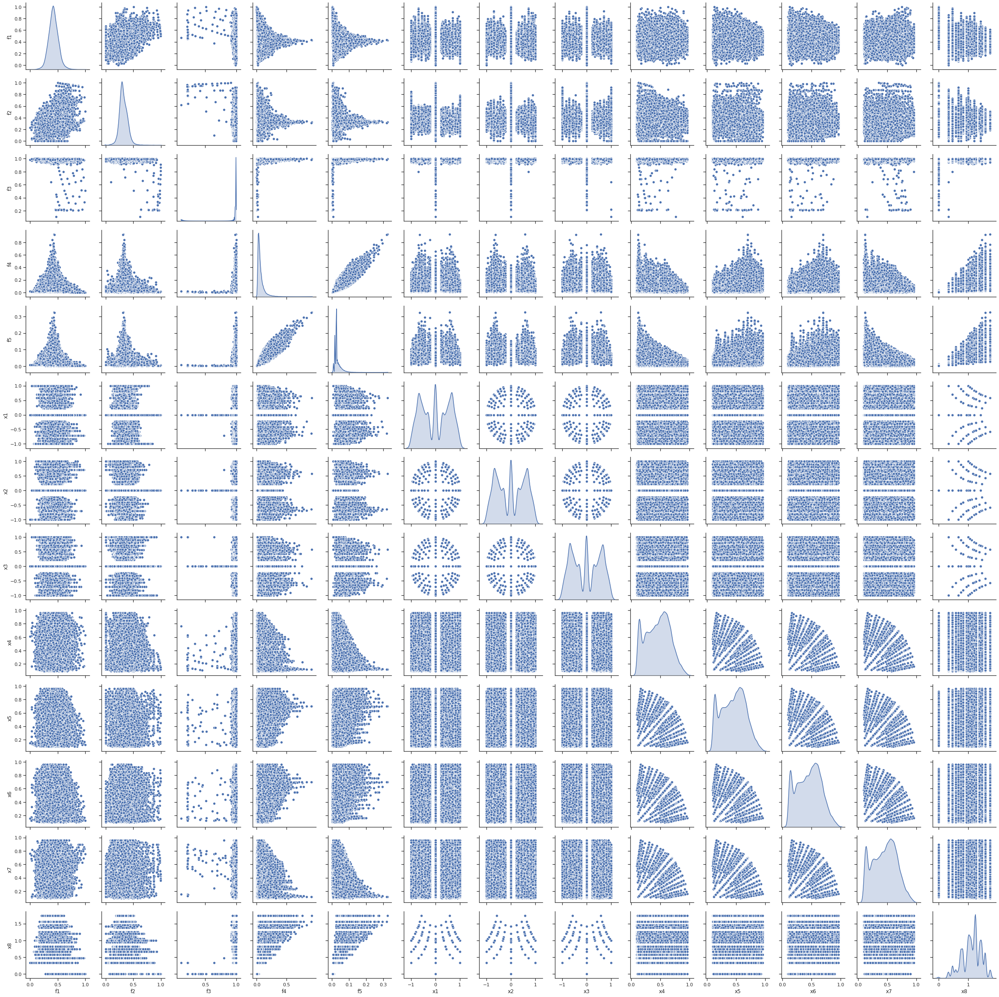

In [16]:
sns.pairplot(df4_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet2_gridSampled_7_processed2_filterd_pairplot.png")

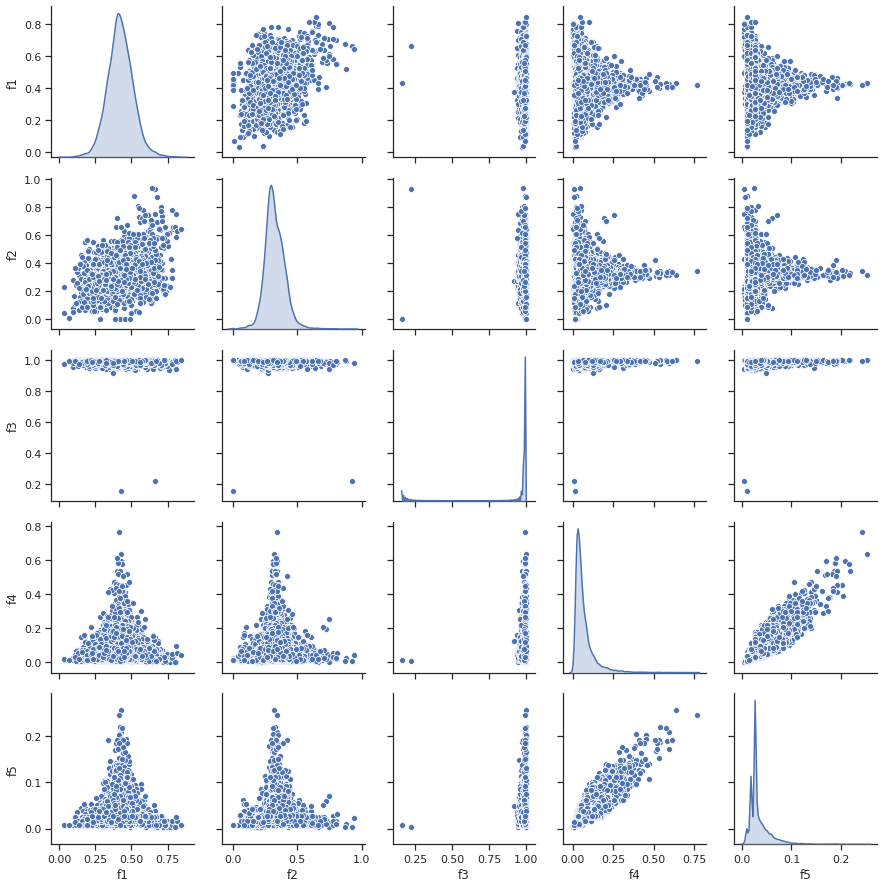

In [29]:
sns.pairplot(df4.sample(10000).loc[:,"f1":"f5"], diag_kind="kde")
plt.savefig("notebooks/graphics/test.png")

In [1]:
%cd "~/lab/NB10422645 (Stage - Airbus)"

#importing libraries
from sklearn import preprocessing
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
sns.set(style="ticks")
%matplotlib inline

[Errno 2] No such file or directory: '/home/ggarrett/lab/NB10422645 (Stage - Airbus)'
/home/ggarrett/lab/stage/notebooks


In [3]:
%cd "~/lab/stage"

from src.problems.two_dimensional import *
test_geometry = MissionGeometry()
test_design = NOmegaPointsScaleBasedPeriodic(int(test_geometry.P_s / 10), 3)
test_spacecraft = Spacecraft()
test_problem = AttitudeTrajectoryProblem2D(test_geometry, test_spacecraft, test_design)


/home/ggarrett/lab/stage


In [2]:
# # import plotly.graph_objects as go
# import plotly.offline as pyo
# from plotly import graph_objs as go
# # Set notebook mode to work in offline
# pyo.init_notebook_mode()
# # import plotly.graph_objects as go
# import numpy as np



# # print(model_1)
# model_folder = f"models/save2/{model1_4_root_name}_{ds_test.name}"
# # print(model_folder)
# trainer = Trainer(model_folder, ds_test, MODEL, torch.optim.SGD, torch.nn.MSELoss, num_epochs=1000, batch_size=10000, learning_rate=1e-1)

# trainer.load_checkpoint(model_folder)

# # trainer.add_scheduler(torch.optim.lr_scheduler.MultiStepLR, milestones=[100, 850], gamma=0.1)
# # trainer.train()

# fixed_xi = 0
# fixed_xj = 5
# scale_per_bound = 1.0

# # TEST DOMAIN
# from src.notebooks.constraint_manifold_sampling import *

# # Get problem bounds.
# bounds = np.array(test_problem.design_space.get_bounds())

# # Transform into bound range.
# bound_range = bounds[1]-bounds[0]


# solution = np.array([0.00192016,
#                     -0.00135844,
#                      0.00226742,
#                      0.4064695,
#                      0.28561942,
#                      0.96828936,
#                      0.50069615])

# #     print(bound_range)

# # Scale bound range for about point basis.
# scaled_bound_range = scale_per_bound * bound_range

# # Create new bounds centralised about point.
# bounds = np.concatenate(([solution+scaled_bound_range],[solution-scaled_bound_range]))

# grid = sampled_grid(bounds[:,[fixed_xi, fixed_xj]], 30, flatten=False)

# # grid = pd.DataFrame(grid).T
# # print(grid)
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

# from copy import deepcopy

# MODEL.eval()

# def get_actual(xi,xj, x_idx=[fixed_xi,fixed_xj], fixed_x=solution, f_idx=0):
# #     assert len(fixed_x) + 2 == len(test_problem.design_space.get_bounds[0])

#     temp = deepcopy(fixed_x)
#     temp[x_idx[0]] = xi
#     temp[x_idx[1]] = xj
#     temp[-4:] /= np.linalg.norm(temp[-4:])
    
#     f = test_problem.fitness(temp)

#     return f[f_idx]

# def get_predict(xi,xj, x_idx=[fixed_xi,fixed_xj], fixed_x=solution, f_idx=0):
# #     assert len(fixed_x) + 2 == len(test_problem.design_space.get_bounds[0])
    
#     temp = deepcopy(fixed_x)
#     temp[x_idx[0]] = xi
#     temp[x_idx[1]] = xj
#     temp[-4:] /= np.linalg.norm(temp[-4:])
    
#     temp[:3] = t1_x_o_mm.transform(temp[:3].reshape(1,-1))
    
#     norm_f3_ =  np.linalg.norm(temp[:3])
#     temp = np.concatenate((temp, [norm_f3_]))
#     temp[:3] /= norm_f3_
    
#     temp = temp.reshape(1,-1)

#     predicted = MODEL(torch.tensor(temp).float().to(device)).detach().cpu().numpy()
# #     print(predicted)
    
#     predicted[0] = t1_f_a.inverse_transform(predicted[0].reshape(1,-1)).reshape(1,-1)
# #     predicted = predicted[:2]
# #     print(predicted)
#     return predicted[0][f_idx]

In [4]:
%cd ~/lab/stage
from sklearn import preprocessing
from src.dataset import *
tf1 = preprocessing.MinMaxScaler(feature_range=(0, 1))
tx2 = preprocessing.StandardScaler()
from torch import nn 
transform = TransformDataFrame.from_ordered_dict(OrderedDict([
    ("tf1", (tf1, ["f1", "f2", "f3", "f4", "f5"])),
    ("tx1", (tx2, [f"x{i}" for i in range(1,653)]))
#     ("tx1", (preprocessing.StandardScaler(), [f"x{i}" for i in range(652)])),
]
))

ds_t1_theta = DataSetFSeries.from_parquet(root_dir="data", file_name="dataSet2_randomSampled_6_series_omega", transform=transform)


class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)
    
class Flatten2(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), 1, -1)
    
class Unflatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), input.size(1), 1, 1)


model2 = nn.Sequential(
    
    Flatten2(),
    
    nn.Conv1d(1, 126, stride=4, kernel_size=72, padding=0),       # [64,   1, 155]
    nn.LeakyReLU(negative_slope=0.01, inplace=True),             # 
    nn.MaxPool1d(11, stride=2, padding=0),                       # [64,   1,  73]
    
    nn.Conv1d(126, 258, stride=1, kernel_size=19, padding=9),     # [128,  1,  73]
    nn.LeakyReLU(negative_slope=0.01, inplace=True),             # 
    nn.MaxPool1d(4, stride=3, padding=0),                        # [128,  1,  24]
    
    nn.Conv1d(258, 258, stride=1, kernel_size=3, padding=1),     # [172,  1,  24]
    nn.LeakyReLU(negative_slope=0.01, inplace=True),             # 
    nn.MaxPool1d(4, stride=2, padding=0),                        # [172,  1,  11]
    
    nn.Conv1d(258,126, stride=1, kernel_size=3, padding=1),      # [128,  1,  11]
    nn.LeakyReLU(negative_slope=0.01, inplace=True),             # 
    nn.MaxPool1d(4, stride=2, padding=0),                        # [128,  1,   5]
    
    Flatten(),
    
    nn.Linear(504, 504),                                       # [,860]
    nn.LeakyReLU(negative_slope=0.01, inplace=True),             # 
    
    nn.Linear(504, 504),                                       # [,860]
    nn.LeakyReLU(negative_slope=0.01, inplace=True),             # 
    
    nn.Linear(504, 5),
    Unflatten()
    )



/home/ggarrett/lab/stage


In [5]:
# import plotly.graph_objects as go
import plotly.offline as pyo
from plotly import graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# import plotly.graph_objects as go
import numpy as np
from torch import nn
from src.surrogate.deeplearning.core import *
from src.surrogate.modules import *


# model1 = nn.Sequential(
#     BasicBlock(input_size=1, output_size=20, kernel_size=(1, 109), stride=1),
#     torch.nn.MaxPool2d((1, 109), stride=10, padding=0, dilation=1, return_indices=False, ceil_mode=False),
#     BasicBlock(input_size=20, output_size=10, kernel_size=(1, 3), stride=1),
#     Flatten(),
#     RegressionOutput(420, 4)
# )
# print(model_1)
model_folder = f"models/dataSet2_randomSampled_6"
# print(model_folder)
trainer = Trainer(model_folder, ds_t1_theta, model2, torch.optim.SGD, torch.nn.MSELoss, num_epochs=1000, batch_size=10000, learning_rate=1e-1)

trainer.load_checkpoint(model_folder)

MODEL = trainer._model

# trainer.add_scheduler(torch.optim.lr_scheduler.MultiStepLR, milestones=[100, 850], gamma=0.1)
# trainer.train()

fixed_xi = 0
fixed_xj = 1
scale_per_bound = 0.5

# TEST DOMAIN
from src.notebooks.constraint_manifold_sampling import *

# Get problem bounds.
bounds = np.array(test_problem.design_space.get_bounds())

# Transform into bound range.
bound_range = bounds[1]-bounds[0]


solution = np.array([0.00192016,
                    -0.00135844,
                     0.00226742,
                     0.4064695,
                     0.28561942,
                     0.96828936,
                     0.50069615])

#     print(bound_range)

# Scale bound range for about point basis.
scaled_bound_range = scale_per_bound * bound_range

# Create new bounds centralised about point.
bounds = np.concatenate(([solution+scaled_bound_range],[solution-scaled_bound_range]))

grid = sampled_grid(bounds[:,[fixed_xi, fixed_xj]], 30, flatten=False)

# grid = pd.DataFrame(grid).T
# print(grid)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

from copy import deepcopy

MODEL.eval()

def get_actual(xi,xj, x_idx=[fixed_xi,fixed_xj], fixed_x=solution, f_idx=0):
#     assert len(fixed_x) + 2 == len(test_problem.design_space.get_bounds[0])

    temp = deepcopy(fixed_x)
    temp[x_idx[0]] = xi
    temp[x_idx[1]] = xj
    temp[-4:] /= np.linalg.norm(temp[-4:])
    
    f = test_problem.fitness(temp)

    return f[f_idx]

reference_time = 6529.276071694349
n_t_samples = 652
init_theta = -3.141592653589793
mapping = NOmegaPointsScaleBasedPeriodic(n_samples=n_t_samples, n_design_points=3, init_theta=init_theta)
mapping.reference_time = reference_time

def get_predict(xi,xj, x_idx=[fixed_xi,fixed_xj], fixed_x=solution, f_idx=0):
#     assert len(fixed_x) + 2 == len(test_problem.design_space.get_bounds[0])
    
    temp = deepcopy(fixed_x)
    temp[x_idx[0]] = xi
    temp[x_idx[1]] = xj
    
    transformed_x = ds_t1_theta.transform.tx1.object.transform(mapping(temp)[1].reshape(1,-1))
    inp = transformed_x.reshape(1, 1, 1, n_t_samples)
    
    predicted = MODEL(torch.tensor(inp).float().to(device)).detach().cpu().numpy().reshape(1,-1)
#     print(predicted)
#     print(predicted.shape)
    predicted[0] = ds_t1_theta.transform.tf1.object.inverse_transform(predicted).reshape(1,-1)
#     predicted = predicted[:2]
#     print(predicted)
    return predicted[0][f_idx]

FileNotFoundError: [Errno 2] File b'models/dataSet2_randomSampled_6/train_log.csv' does not exist: b'models/dataSet2_randomSampled_6/train_log.csv'

In [ ]:
from plotly.subplots import make_subplots

# print(t1_f_a.min_)
actual    = np.vectorize(get_actual)(grid[0], grid[1], f_idx=0)
predicted = np.vectorize(get_predict)(grid[0], grid[1], f_idx=0)

se = np.sqrt(np.abs(predicted - actual))
mse = np.mean(se)
print(mse)

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]])

fig.add_trace(go.Surface(z=actual, colorscale='Viridis', opacity=0.9), row=1, col=1)
fig.add_trace(go.Surface(z=predicted,  opacity=0.9, showscale=True), row=1, col=2)


fig.update_layout(title=go.layout.Title(
        text="$f_0(x_0, x_1)$",
        xref="paper",
        x=0)
)

fig.show()

In [1]:
from plotly.subplots import make_subplots

# print(t1_f_a.min_)
actual    = np.vectorize(get_actual)(grid[0], grid[1], f_idx=1)
predicted = np.vectorize(get_predict)(grid[0], grid[1], f_idx=1)

se = np.sqrt(np.abs(predicted - actual))
mse = np.mean(se)
print(mse)

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]])

fig.add_trace(go.Surface(z=actual, colorscale='Viridis', opacity=0.9), row=1, col=1)
fig.add_trace(go.Surface(z=predicted,  opacity=0.9, showscale=True), row=1, col=2)

fig.update_layout(title=go.layout.Title(
        text="$f_1(x_0, x_1)$",
        xref="paper",
        x=0)
)

fig.show()

NameError: name 'get_actual' is not defined

0.06360328340633786


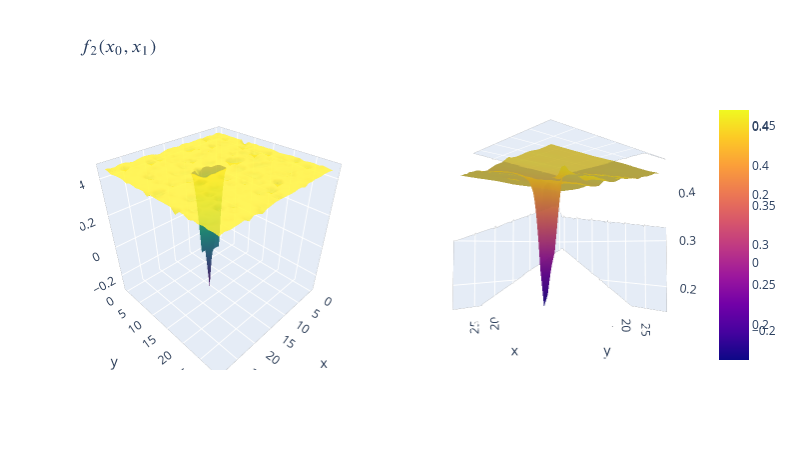

In [8]:
# print(t1_f_a.min_)
actual    = np.vectorize(get_actual)(grid[0], grid[1], f_idx=2)
predicted = np.vectorize(get_predict)(grid[0], grid[1], f_idx=2)

se = np.sqrt(np.abs(predicted - actual))
mse = np.mean(se)
print(mse)

import plotly.express as px

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]])

fig.add_trace(go.Surface(z=actual, colorscale='Viridis', opacity=0.9), row=1, col=1)
fig.add_trace(go.Surface(z=predicted,  opacity=0.9, showscale=True), row=1, col=2)

fig.update_layout(title=go.layout.Title(
        text="$f_2(x_0, x_1)$",
        xref="paper",
        x=0)
)

fig.show()

0.06592971684465215


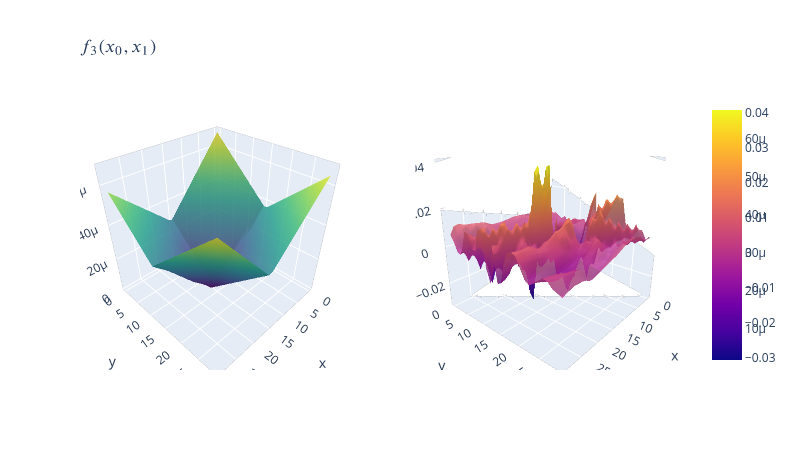

In [9]:
# print(t1_f_a.min_)
actual    = np.vectorize(get_actual)(grid[0], grid[1], f_idx=3)
predicted = np.vectorize(get_predict)(grid[0], grid[1], f_idx=3)

se = np.sqrt(np.abs(predicted - actual))
mse = np.mean(se)
print(mse)

import plotly.express as px

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]])

fig.add_trace(go.Surface(z=actual, colorscale='Viridis', opacity=0.9), row=1, col=1)
fig.add_trace(go.Surface(z=predicted,  opacity=0.9, showscale=True), row=1, col=2)

fig.update_layout(title=go.layout.Title(
        text="$f_3(x_0, x_1)$",
        xref="paper",
        x=0)
)

fig.show()

0.5330819041597604


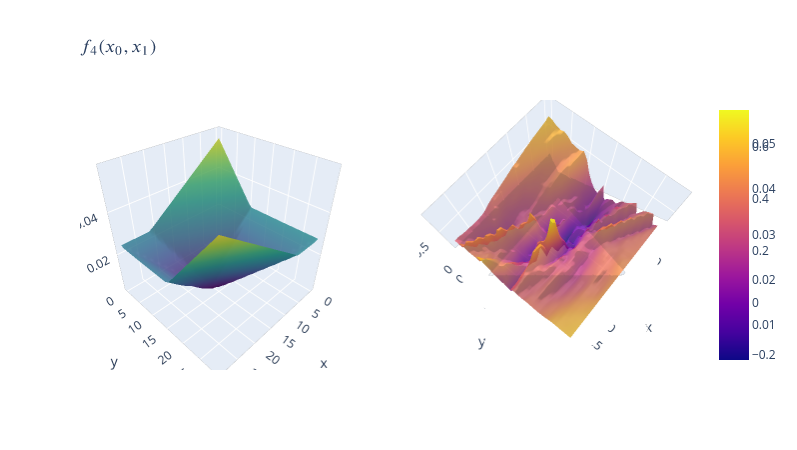

In [10]:
# print(t1_f_a.min_)
actual    = np.vectorize(get_actual)(grid[0], grid[1], f_idx=4)
predicted = np.vectorize(get_predict)(grid[0], grid[1], f_idx=4)

se = np.sqrt(np.abs(predicted - actual))
mse = np.mean(se)
print(mse)

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]])

fig.add_trace(go.Surface(z=actual, colorscale='Viridis', opacity=0.9), row=1, col=1)
fig.add_trace(go.Surface(z=predicted,  opacity=0.9, showscale=True), row=1, col=2)

fig.update_layout(title=go.layout.Title(
        text="$f_4(x_0, x_1)$",
        xref="paper",
        x=0)
)

fig.show()

In [ ]:
solution = np.array([0.00192016,
                    -0.00135844,
                     0.00226742,
                     0.4064695,
                     0.28561942,
                     0.96828936,
                     0.50069615])

In [133]:
model_2.eval()

temp = deepcopy(solution)
temp[-4:] /= np.linalg.norm(temp[-4:])

temp[:3] = t1_x_o_mm.transform(temp[:3].reshape(1,-1))
norm_f3_ =  np.linalg.norm(temp[:3])
temp = np.concatenate((temp, [norm_f3_]))
temp[:3] /= norm_f3_
temp = temp.reshape(1,-1)

predicted = model_2(torch.tensor(temp).float()).detach().cpu().numpy()
predicted[0] = t1_f_a.inverse_transform(predicted[0].reshape(1,-1)).reshape(1,-1)

tensor_ = torch.tensor(temp).float()

In [134]:
%%timeit

predicted = model_2(tensor_)

1.9 ms ± 10.3 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [87]:
%%timeit

test_problem.fitness(solution)

424 µs ± 609 ns per loop (mean ± std. dev. of 7 runs, 1000 loops each)
